In [1]:
# Import Dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import hvplot.pandas


In [2]:
# Reading csv files
evdata= pd.read_csv('../Cleaned_Data_Sets/Cleaned_EV_Data.csv')
evdata.head()

,County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Electric Range,Vehicle Location Longitude,Vehicle Location Latitude
0,Yakima,Yakima,WA,98908.0,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),322,-120.56916,46.58514
1,San Diego,San Diego,CA,92101.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),220,-117.16171,32.71568
2,Lane,Eugene,OR,97404.0,2021,VOLVO,S60,Plug-in Hybrid Electric Vehicle (PHEV),22,-123.12802,44.09573
3,Yakima,Yakima,WA,98908.0,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),289,-120.56916,46.58514
4,Snohomish,Bothell,WA,98021.0,2017,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),14,-122.18384,47.80310


In [3]:
# Looking at data to determine cleansing needs
evdata.count()

County                        124687
City                          124687
State                         124687
Postal Code                   124687
Model Year                    124687
Make                          124687
Model                         124506
Electric Vehicle Type         124687
Electric Range                124687
Vehicle Location Longitude    124687
Vehicle Location Latitude     124687
dtype: int64

In [4]:
# Cleaning the data to remove 'null' and '0' values
cleansed_evdata= evdata.dropna(how= 'any')
pandc_evdata= cleansed_evdata.loc[cleansed_evdata['Electric Range'] != 0]
pandc_evdata.count()

County                        75013
City                          75013
State                         75013
Postal Code                   75013
Model Year                    75013
Make                          75013
Model                         75013
Electric Vehicle Type         75013
Electric Range                75013
Vehicle Location Longitude    75013
Vehicle Location Latitude     75013
dtype: int64

In [5]:
# Isolating Electric Vehicle Battery types and Electric Ranges for comparison
batt_reduced_df=pandc_evdata[['Electric Range',
                              'Electric Vehicle Type']]
batt_reduced_df

,Electric Range,Electric Vehicle Type
0,322,Battery Electric Vehicle (BEV)
1,220,Battery Electric Vehicle (BEV)
2,22,Plug-in Hybrid Electric Vehicle (PHEV)
3,289,Battery Electric Vehicle (BEV)
4,14,Plug-in Hybrid Electric Vehicle (PHEV)
...,...,...
124678,25,Plug-in Hybrid Electric Vehicle (PHEV)
124679,72,Plug-in Hybrid Electric Vehicle (PHEV)
124683,26,Plug-in Hybrid Electric Vehicle (PHEV)
124685,238,Battery Electric Vehicle (BEV)


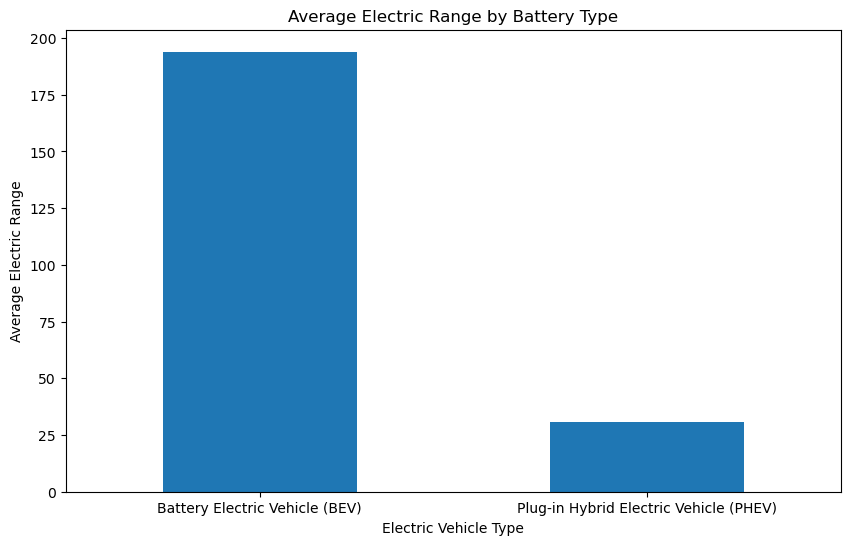

In [6]:
# Plotting BEV vs PHEV data
batt_comp = batt_reduced_df.groupby('Electric Vehicle Type')['Electric Range'].mean()

# Plotting the bar chart
plt.figure(figsize=(10, 6))
batt_comp.plot(kind='bar')
plt.xlabel('Electric Vehicle Type')
plt.ylabel('Average Electric Range')
plt.title('Average Electric Range by Battery Type')
plt.xticks(rotation=0)
plt.show()

In [7]:
# Data sort to align make and average electric range
make_data_comp = pandc_evdata.groupby(['Make',
                                       'Model',
                                       'Electric Vehicle Type'])['Electric Range'].mean().reset_index()
make_data_comp.head()

,Make,Model,Electric Vehicle Type,Electric Range
0,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),16.000000
1,AUDI,A7,Plug-in Hybrid Electric Vehicle (PHEV),24.000000
2,AUDI,A8 E,Plug-in Hybrid Electric Vehicle (PHEV),17.000000
3,AUDI,E-TRON,Battery Electric Vehicle (BEV),208.408163
4,AUDI,E-TRON SPORTBACK,Battery Electric Vehicle (BEV),218.000000


In [8]:
# Sorting to find the top 5 ranges and make
# Sort top 5 PHEV makes
top_5_phev = make_data_comp[make_data_comp['Electric Vehicle Type'] == 'Plug-in Hybrid Electric Vehicle (PHEV)']
top_5_phev = top_5_phev.sort_values('Electric Range',
                                     ascending=False).head(10)

# Sort top 5 BEV makes
top_5_bev = make_data_comp[make_data_comp['Electric Vehicle Type'] == 'Battery Electric Vehicle (BEV)']
top_5_bev = top_5_bev.sort_values('Electric Range', 
                                  ascending=False).head(10)

C:\Users\edmon\AppData\Local\Temp\ipykernel_40520\1570983290.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels(axs[0].get_xticklabels(),


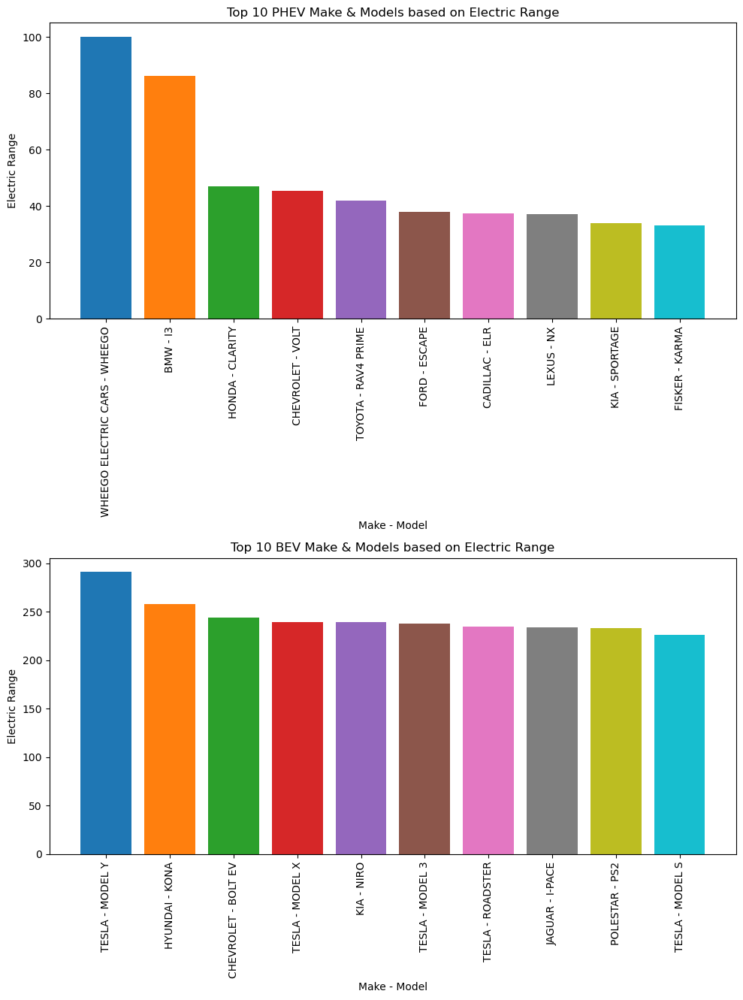

In [9]:
# Create a figure with two subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# Plot top 5 PHEV makes with model information
for i, (_, row) in enumerate(top_5_phev.iterrows()):
    axs[0].bar(row['Make'] + ' - ' + row['Model'],
               row['Electric Range'], 
               label=row['Model'])

axs[0].set_title('Top 10 PHEV Make & Models based on Electric Range')
axs[0].set_xlabel('Make - Model')
axs[0].set_ylabel('Electric Range')
axs[0].set_xticklabels(axs[0].get_xticklabels(),
                    rotation=90)

# Plot top 5 BEV makes with model information
for i, (_, row) in enumerate(top_5_bev.iterrows()):
    axs[1].bar(row['Make'] + ' - ' + row['Model'], 
               row['Electric Range'], 
               label=row['Model'])

axs[1].set_title('Top 10 BEV Make & Models based on Electric Range')
axs[1].set_xlabel('Make - Model')
axs[1].set_ylabel('Electric Range')

# Adjust spacing between subplots
plt.tight_layout()

# Set x-axis tick label rotation angle
plt.xticks(rotation=90)

# Display the plot
plt.show()


In [10]:
# Bringing in the census data to create map of ev models by county
census_data= pd.read_csv('../Cleaned_Data_Sets/Cleaned_Census_Income_Data.csv')
census_data.head()

,County,Median income (dollars)
0,Adams,51601
1,Asotin,53941
2,Benton,72046
3,Chelan,61304
4,Clallam,55090


In [11]:
# Recall original dataset for merge
county_mapping= pandc_evdata.groupby(['Make',
                                      'Model',
                                      'Electric Vehicle Type',
                                      'County'])['Electric Range'].mean().reset_index()
county_mapping.head()

# Merging census data with current data
merged_ev_data= pd.merge(county_mapping, 
                         census_data, 
                         on= 'County', 
                         how= 'inner')
merged_ev_data

,Make,Model,Electric Vehicle Type,County,Electric Range,Median income (dollars)
0,AUDI,A3,Plug-in Hybrid Electric Vehicle (PHEV),Adams,16.0,51601
1,BMW,I3,Plug-in Hybrid Electric Vehicle (PHEV),Adams,97.0,51601
2,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Adams,248.5,51601
3,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Adams,41.0,51601
4,CHRYSLER,PACIFICA,Plug-in Hybrid Electric Vehicle (PHEV),Adams,32.0,51601
...,...,...,...,...,...,...
1542,VOLVO,XC90,Plug-in Hybrid Electric Vehicle (PHEV),Columbia,18.0,61779
1543,FORD,C-MAX,Plug-in Hybrid Electric Vehicle (PHEV),Garfield,19.0,56923
1544,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Garfield,19.0,56923
1545,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Garfield,215.0,56923


In [12]:
# Creating the map
washington_map = evdata.hvplot.points(
    x= 'Vehicle Location Longitude',
    y= 'Vehicle Location Latitude',
    c= 'Make',
    title= 'Electric Vehicles by Make in Washington',
    geo= True,
    tiles= 'OSM',
    frame_width= 1200,
    frame_height= 850,
    alpha= 0.5,
    hover_cols= ['Make',
                 'Model',
                 'Electric Range',
                 'County'],
    size= 50,
    legend= 'top_left'
)

# Showing the map
washington_map

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Vehicle Location Longitude,Vehicle Location Latitude]   (Make,Model,Electric Range,County)